In [1]:
import pandas as pd 
from matplotlib import pyplot as plt 

In [2]:
stock_data = pd.read_csv("stock_data.csv", index_col="Date")

In [3]:
print(len(stock_data))

19586


In [3]:
company_list = tuple(set(stock_data["Stock"]))
print(company_list)

('FB', 'TSLA', 'AAPL', 'MSFT')


In [4]:
aapl_stock_data = stock_data[stock_data["Stock"] == "AAPL"]
fb_stock_data = stock_data[stock_data["Stock"] == "FB"]
msft_stock_data = stock_data[stock_data["Stock"] == "MSFT"]
tsla_stock_data = stock_data[stock_data["Stock"] == "TSLA"]

In [5]:
company_stock_data = dict(zip(('TSLA', 'AAPL', 'MSFT', 'FB'), (tsla_stock_data, aapl_stock_data, msft_stock_data, fb_stock_data)))

In [6]:
company_stock_data["AAPL"].tail(10)

,Open,High,Low,Close,Volume,OpenInt,Stock
Date,,,,,,,
2017-10-30,163.30,167.47,163.13,166.12,44861465,0,AAPL
2017-10-31,167.30,169.04,166.34,168.43,36176411,0,AAPL
2017-11-01,169.26,169.33,165.02,166.29,33758685,0,AAPL
2017-11-02,167.04,167.90,164.69,167.51,41542177,0,AAPL
2017-11-03,173.38,173.64,170.51,171.88,59612161,0,AAPL
2017-11-06,171.75,174.36,171.10,173.63,34901241,0,AAPL
2017-11-07,173.29,174.51,173.29,174.18,24424877,0,AAPL
2017-11-08,174.03,175.61,173.71,175.61,24451166,0,AAPL
2017-11-09,174.48,175.46,172.52,175.25,29533086,0,AAPL


In [103]:
def showHistoricalPrice(df, n, cp_name):
    if n > 0:
        df = df.head(n)
    plt.figure(figsize=(50, 30))
    for i, price in enumerate(("Open", "Close", "Low", "High"), 1):
        plt.subplot(2, 2, i)
        df[price].plot()
        plt.xlabel(None)
        plt.xticks(rotation=45, fontsize=50)
        plt.yticks(fontsize=50)
        plt.title(f"{price} prices of {cp_name}", fontsize=50)

    plt.tight_layout()
    plt.show()

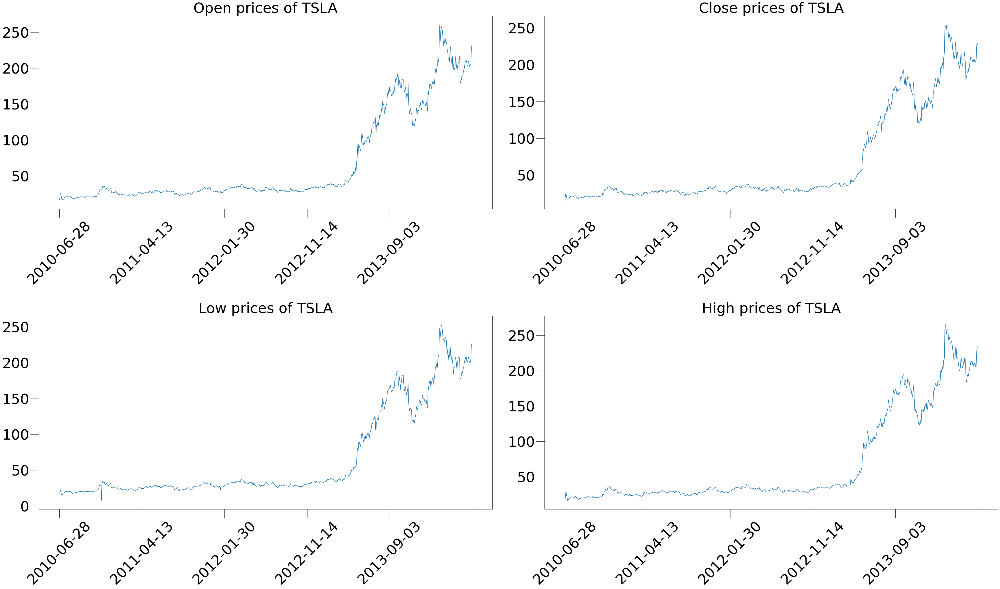

In [108]:
index_company = 1
showHistoricalPrice(company_stock_data[company_list[index_company]], 1000, company_list[index_company])

In [123]:
def showTogetherHistoricalPrice(df, n, cp_name):
    if n > 0:
        df = df.head(n)
    fig = plt.figure(figsize=(30, 20))
    axe = fig.add_subplot()
    df[["Open", "Close", "Low", "High"]].plot(ax=axe)
    axe.set_xlabel(None)
    axe.set_title(f"Stock prices of {cp_name}", fontsize=50)
    plt.xticks(fontsize=60, rotation=45)
    plt.yticks(fontsize=60)
    plt.legend(loc=2, prop={'size': 60})
    plt.tight_layout()
    plt.show()

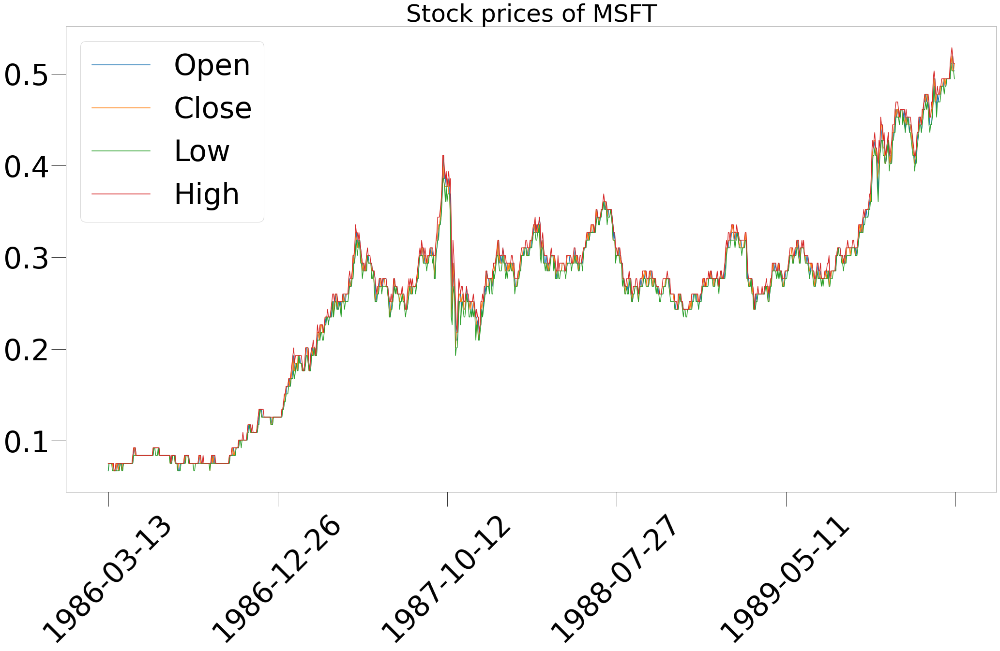

In [127]:
index_company = 3
showTogetherHistoricalPrice(company_stock_data[company_list[index_company]], 1000, company_list[index_company])

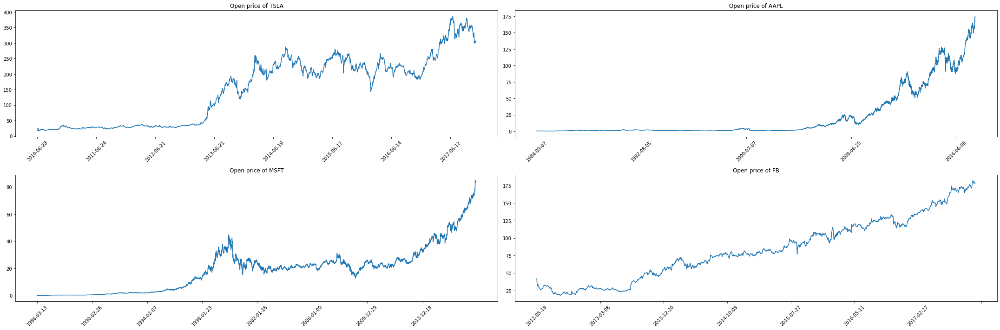

In [11]:
# Open price of 4 companies
plt.figure(figsize=(30, 10))
for i, (cmp_name, cmp) in enumerate(company_stock_data.items(), 1):
    axe = plt.subplot(2, 2, i)
    cmp["Open"].plot()
    plt.xlabel(None)
    plt.xticks(rotation=45)
    plt.title(f"Open price of {cmp_name}")

plt.tight_layout()
plt.show()

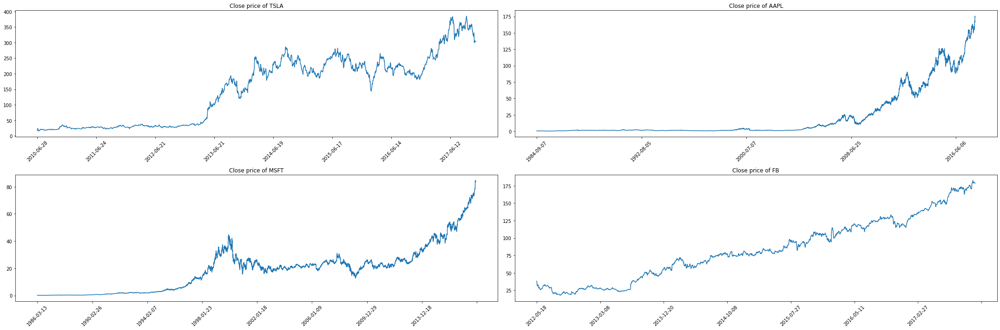

In [12]:
# Close price of 4 companies
plt.figure(figsize=(30, 10))
for i, (cmp_name, cmp) in enumerate(company_stock_data.items(), 1):
    axe = plt.subplot(2, 2, i)
    cmp["Close"].plot()
    plt.xticks(rotation=45)
    plt.xlabel(None)
    plt.title(f"Close price of {cmp_name}")

plt.tight_layout()
plt.show()

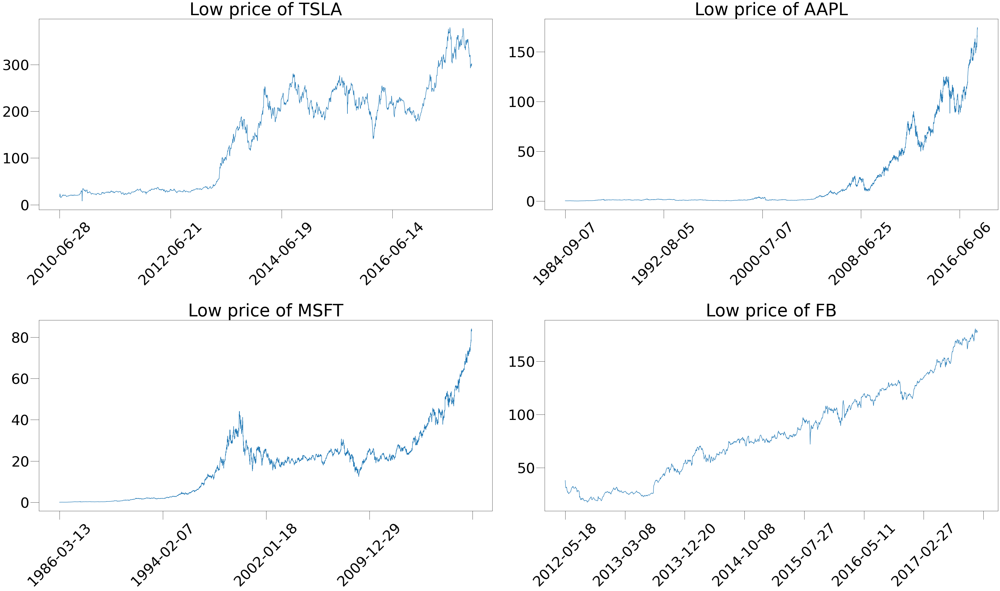

In [102]:
# Low price of 4 companies
plt.figure(figsize=(50, 30))
for i, (cmp_name, cmp) in enumerate(company_stock_data.items(), 1):
    axe = plt.subplot(2, 2, i)
    cmp["Low"].plot()
    plt.xticks(rotation=45)
    plt.xlabel(None)
    plt.title(f"Low price of {cmp_name}")

plt.tight_layout()
plt.show()

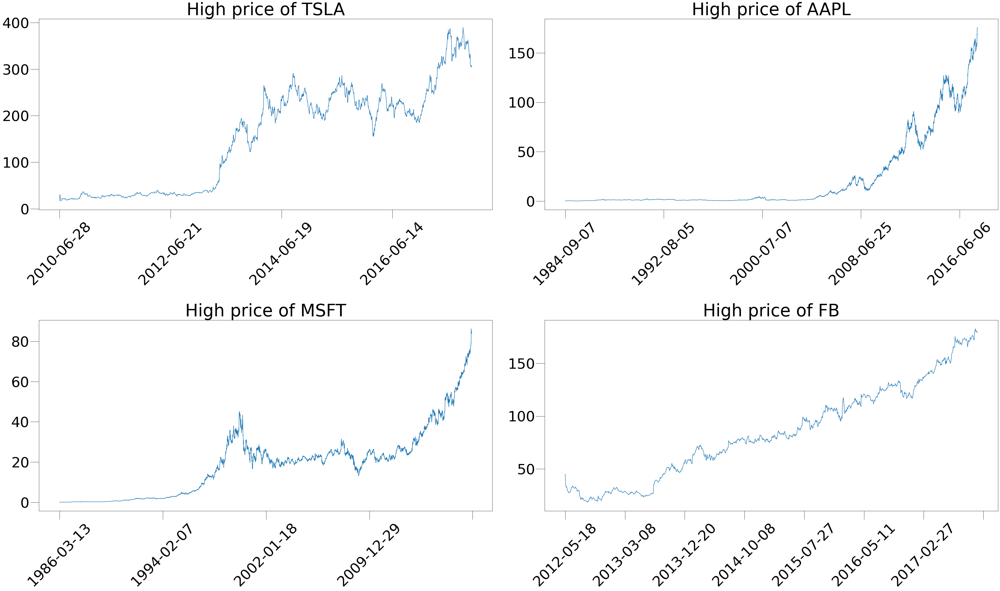

In [101]:
# High price of 4 companies
plt.figure(figsize=(50, 30))
for i, (cmp_name, cmp) in enumerate(company_stock_data.items(), 1):
    axe = plt.subplot(2, 2, i)
    cmp["High"].plot()
    plt.xticks(rotation=45)
    plt.xlabel(None)
    plt.title(f"High price of {cmp_name}")

plt.tight_layout()
plt.show()

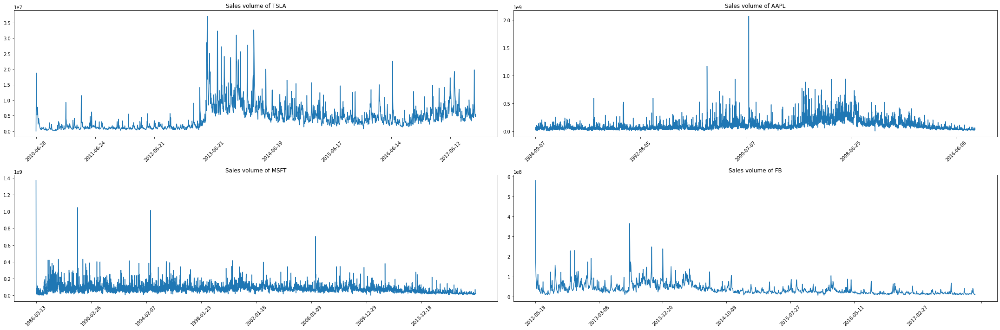

In [15]:
# Sales volume of 4 companies
plt.figure(figsize=(30, 10))
for i, (cmp_name, cmp) in enumerate(company_stock_data.items(), 1):
    axe = plt.subplot(2, 2, i)
    cmp["Volume"].plot()
    plt.xticks(rotation=45)
    plt.xlabel(None)
    plt.title(f"Sales volume of {cmp_name}")

plt.tight_layout()
plt.show()

In [8]:
ma_day = [10, 20, 50]

for ma in ma_day:
    for company in company_list:
        column_name = f"MA for {ma} days"
        company_stock_data[company][column_name] = company_stock_data[company]['Close'].rolling(ma).mean()

<ipython-input-8-815aa5ec1a54>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_stock_data[company][column_name] = company_stock_data[company]['Close'].rolling(ma).mean()


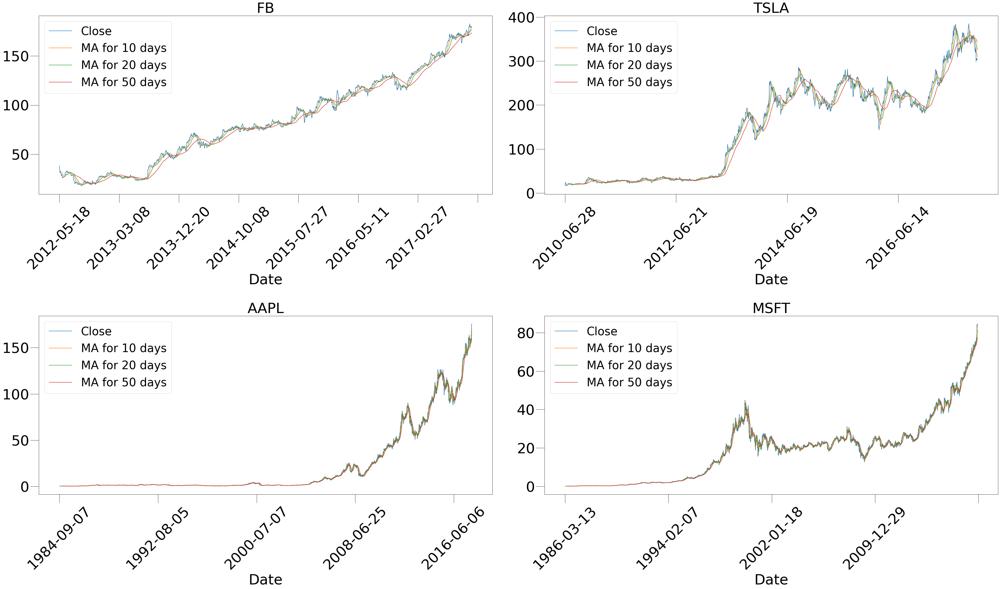

In [100]:
fig, axes = plt.subplots(nrows=2, ncols=2)
fig.set_figheight(30)
fig.set_figwidth(50)
plt.rcParams.update({'font.size': 50})

company_stock_data[company_list[0]][['Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[0, 0], rot=45)
axes[0, 0].set_title(company_list[0], fontsize=50)
axes[0, 0].legend(loc=2, prop={'size': 40})

company_stock_data[company_list[1]][['Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[0 ,1], rot=45)
axes[0, 1].set_title(company_list[1], fontsize=50)
axes[0, 1].legend(loc=2, prop={'size': 40})

company_stock_data[company_list[2]][['Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[1, 0], rot=45)
axes[1, 0].set_title(company_list[2], fontsize=50)
axes[1, 0].legend(loc=2, prop={'size': 40})

company_stock_data[company_list[3]][['Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[1, 1], rot=45)
axes[1, 1].set_title(company_list[3], fontsize=50)
axes[1, 1].legend(loc=2, prop={'size': 40})

fig.tight_layout()

In [18]:
for company_name in company_stock_data.keys():
    company_stock_data[company_name]['Daily Return'] = company_stock_data[company_name]['Close'].pct_change()

<ipython-input-18-68097a940def>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  company_stock_data[company_name]['Daily Return'] = company_stock_data[company_name]['Close'].pct_change()


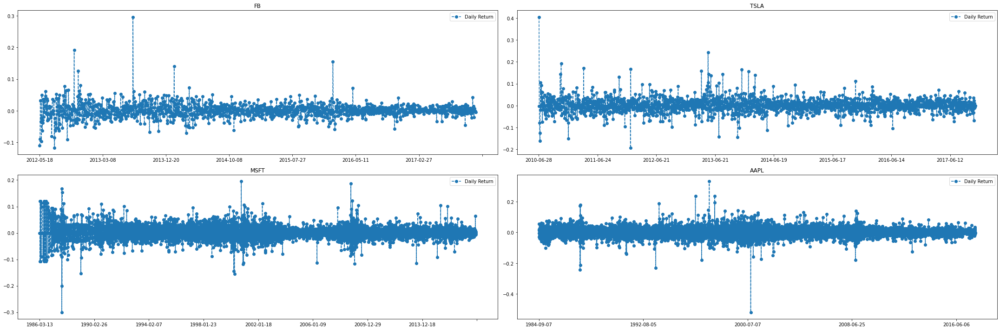

In [19]:
fig, axes = plt.subplots(nrows=2, ncols=2)
fig.set_figheight(10)
fig.set_figwidth(30)

company_stock_data[company_list[0]]['Daily Return'].plot(ax=axes[0,0], legend=True, linestyle='--', marker='o')
axes[0, 0].set_title(company_list[0])
axes[0, 0].set_xlabel(None)

company_stock_data[company_list[1]]['Daily Return'].plot(ax=axes[0,1], legend=True, linestyle='--', marker='o')
axes[0, 1].set_title(company_list[1])
axes[0, 1].set_xlabel(None)

company_stock_data[company_list[2]]['Daily Return'].plot(ax=axes[1,0], legend=True, linestyle='--', marker='o')
axes[1, 0].set_title(company_list[2])
axes[1, 0].set_xlabel(None)

company_stock_data[company_list[3]]['Daily Return'].plot(ax=axes[1,1], legend=True, linestyle='--', marker='o')
axes[1, 1].set_title(company_list[3])
axes[1, 1].set_xlabel(None)

fig.tight_layout()

In [20]:
import seaborn as sns
from pandas_datareader import DataReader

In [21]:
'''
tmp_dates = [company_stock_data[company_name].index.to_list() for company_name in company_list]
dates = []
for date in tmp_dates:
    dates += date
'''
dates = [company_stock_data[company_name].index.to_list() for company_name in company_list]
start = max([min(date) for date in dates])
end = min([max(date) for date in dates])

In [22]:
closing_df = DataReader(company_list, "yahoo", start, end)["Close"]
closing_df.head(10)

Symbols,FB,TSLA,MSFT,AAPL
Date,,,,
2012-05-17,NaN,5.714,29.719999,18.932858
2012-05-18,38.230000,5.512,29.270000,18.942142
2012-05-21,34.029999,5.754,29.750000,20.045713
2012-05-22,31.000000,6.160,29.760000,19.891787
2012-05-23,32.000000,6.204,29.110001,20.377144
2012-05-24,33.029999,6.056,29.070000,20.190001
2012-05-25,31.910000,5.962,29.059999,20.081785
2012-05-29,28.840000,6.338,29.559999,20.438213
2012-05-30,28.190001,6.082,29.340000,20.684643


In [23]:
company_daily_returns = closing_df.pct_change()
company_daily_returns.head(10)

Symbols,FB,TSLA,MSFT,AAPL
Date,,,,
2012-05-17,NaN,NaN,NaN,NaN
2012-05-18,NaN,-0.035352,-0.015141,0.000490
2012-05-21,-0.109861,0.043904,0.016399,0.058260
2012-05-22,-0.089039,0.070560,0.000336,-0.007679
2012-05-23,0.032258,0.007143,-0.021841,0.024400
2012-05-24,0.032187,-0.023856,-0.001374,-0.009184
2012-05-25,-0.033909,-0.015522,-0.000344,-0.005360
2012-05-29,-0.096208,0.063066,0.017206,0.017749
2012-05-30,-0.022538,-0.040391,-0.007442,0.012057


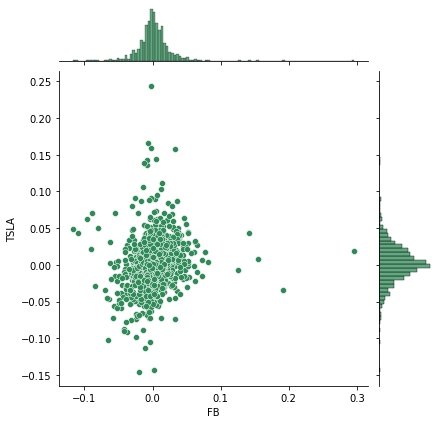

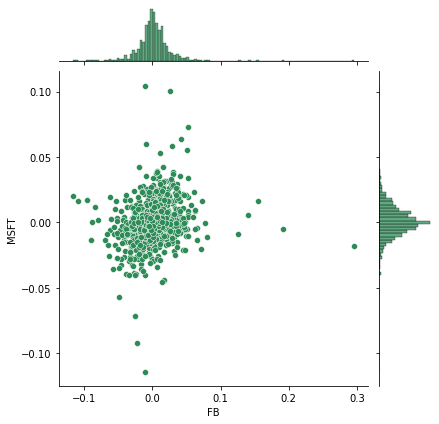

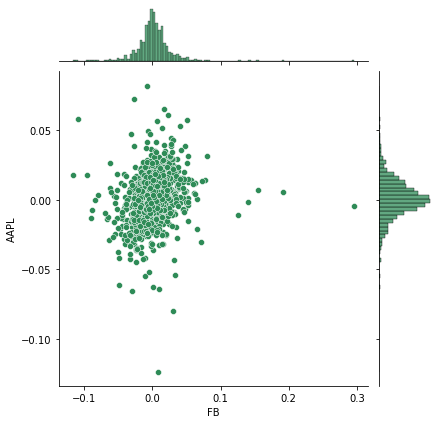

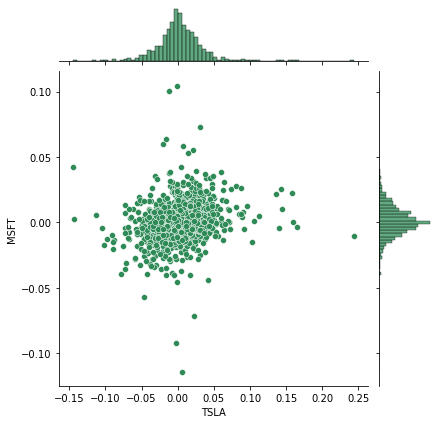

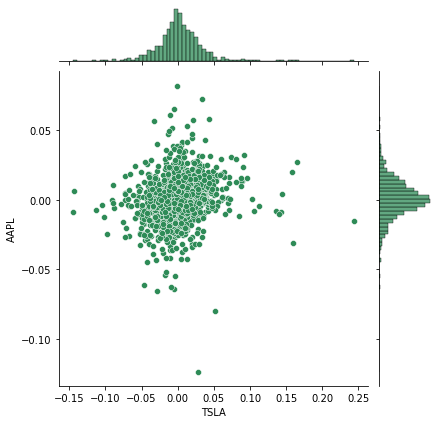

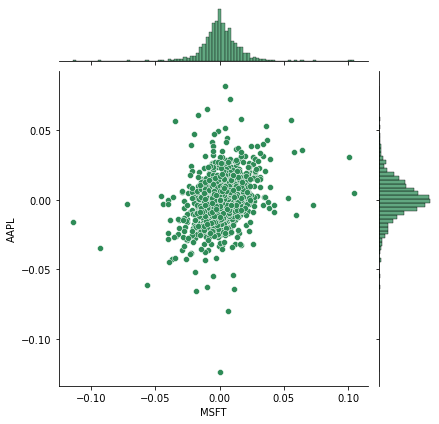

In [24]:
for x in company_list:
    for y in range(company_list.index(x)+1, len(company_list)):
        sns.jointplot(x=x, y=company_daily_returns[company_list[y]], data=company_daily_returns, kind='scatter', color='seagreen')

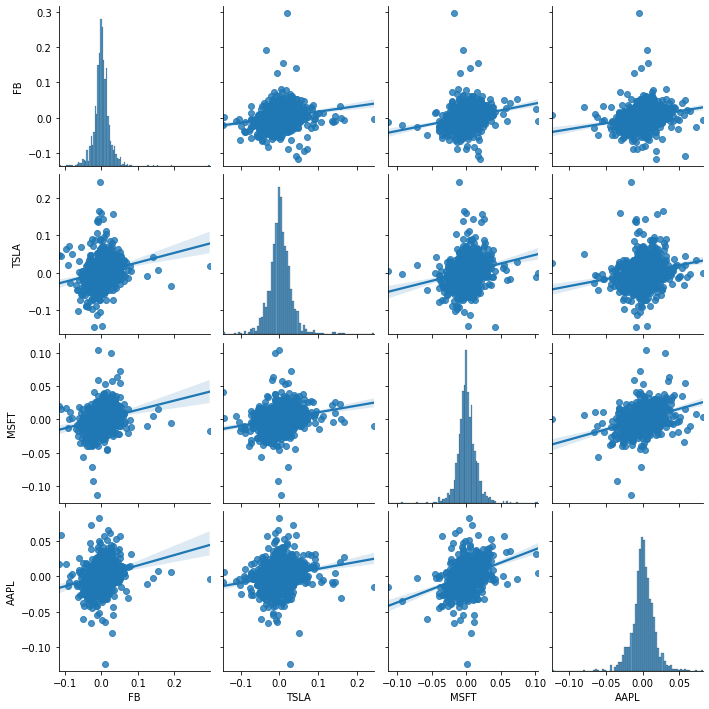

In [25]:
sns.pairplot(company_daily_returns, kind='reg')